# Pre-trained Model Exploration

### Goal
In this notebook, you will begin playing with generative models. Do not worry if you are not sure about anything you see here - you will learn all about these models and parameter in this course!

Simply run a couple of generative models and check out their cool outputs.

### Learning Objectives
1. See some generative models in action!





## StyleGAN - faces

#### Run the generative model called StyleGAN to generate fake faces.

You are going to use the original paper's implementation of StyleGAN. Be sure to scroll all the way down and look at a face it generates.

In [ ]:
!git clone https://github.com/NVlabs/stylegan.git

Cloning into 'stylegan'...
remote: Enumerating objects: 89, done.
remote: Total 89 (delta 0), reused 0 (delta 0), pack-reused 89
Unpacking objects: 100% (89/89), done.


In [ ]:
%tensorflow_version 1.x
# Import needed Python libraries
import os
import pickle
import warnings
import numpy as np
import PIL

from tensorflow.python.util import module_wrapper
module_wrapper._PER_MODULE_WARNING_LIMIT = 0

# Import the official StyleGAN repo
import stylegan
from stylegan.dnnlib import tflib
from stylegan import config

# Initialize TensorFlow
tflib.init_tf()

# Move into the StyleGAN directory, if you're not in it already
path = 'stylegan/'
if "stylegan" not in os.getcwd():
    os.chdir(path)

After that, `%tensorflow_version 1.x` will throw an error.

Your notebook should be updated to use Tensorflow 2.
See the guide at https://www.tensorflow.org/guide/migrate#migrate-from-tensorflow-1x-to-tensorflow-2.

TensorFlow 1.x selected.


In [ ]:
# Load pre-trained StyleGAN network
url = 'https://bitbucket.org/ezelikman/gans/downloads/karras2019stylegan-ffhq-1024x1024.pkl' # karras2019stylegan-ffhq-1024x1024.pkl
with stylegan.dnnlib.util.open_url(url, cache_dir=stylegan.config.cache_dir) as f:
  # You'll load 3 components, and use the last one Gs for sampling images.
  #   _G = Instantaneous snapshot of the generator. Mainly useful for resuming a previous training run.
  #   _D = Instantaneous snapshot of the discriminator. Mainly useful for resuming a previous training run.
  #   Gs = Long-term average of the generator. Yields higher-quality results than the instantaneous snapshot.
  _G, _D, Gs = pickle.load(f)

  print('StyleGAN package loaded successfully!')

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
StyleGAN package loaded successfully!


In [ ]:
#@title Generate faces with StyleGAN
#@markdown Double click here to see the code. After setting truncation, run the cells below to generate images. This adjusts the truncation, you will learn more about this soon! Truncation trades off fidelity (quality) and diversity of the generated images - play with it!

Truncation = 0.7 #@param {type:"slider", min:0.1, max:1, step:0.1}

print(f'Truncation set to {Truncation}. \nNow run the cells below to generate images with this truncation value.')

Truncation set to 0.7. 
Now run the cells below to generate images with this truncation value.


In [ ]:
# Set the random state. Nothing special about 42,
#   except that it's the meaning of life.
rnd = np.random.RandomState(42)

print(f'Random state is set.')

Random state is set.


You'll default to 4 images for the run, which is called a batch. Feel free to generate more by changing this parameter, but note that very large batch sizes will cause the model to run out of memory.

In [ ]:
batch_size = 6 #@param {type:"slider", min:1, max:10, step:1}

print(f'Batch size is {batch_size}...')

Batch size is 6...


Noise vectors make sure the generated images are randomly (stochastically) different, not all the same. Notice that there is a noise vector for each image in the batch. You can run this next cell as many times as you want to get new noise vectors, and as a result, new images!

In [ ]:
input_shape = Gs.input_shape[1]
noise_vectors = rnd.randn(batch_size, input_shape)

print(f'There are {noise_vectors.shape[0]} noise vectors, each with {noise_vectors.shape[1]} random values between -{Truncation} and {Truncation}.')

There are 6 noise vectors, each with 512 random values between -0.7 and 0.7.


Run the model to generate the images. 

Notice that truncation and noise vectors are passed in. Don't worry too much about the other stuff - it's about output formats and adding additional randomness/diversity to the output.

In [ ]:
fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
images = Gs.run(noise_vectors, None, truncation_psi=Truncation, randomize_noise=False, output_transform=fmt)

print(f'Successfully sampled {batch_size} images from the model.')

Successfully sampled 6 images from the model.


Now you save and visualize the images. Feel free to regenerate the noise vectors above and run the cells afterwards to see new images. 

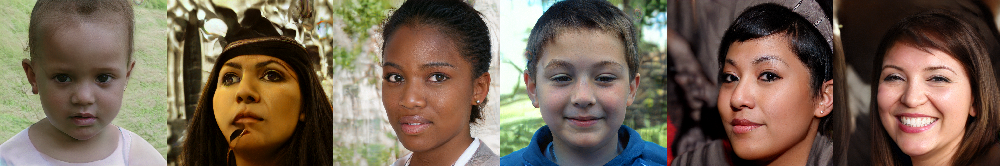

In [ ]:
# Save the images
os.makedirs(config.result_dir, exist_ok=True)
png_filename = os.path.join(config.result_dir, 'stylegan-example.png')
if batch_size > 1:
  img = np.concatenate(images, axis=1)
else:
  img = images[0]
PIL.Image.fromarray(img, 'RGB').save(png_filename)

# Check the images out!
from IPython.display import Image
Image(png_filename, width=256*batch_size, height=256)